<a href="https://colab.research.google.com/github/tripathiR36/yolov5/blob/master/Updated_Project_ee_769_Intrusion_detection_using_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EE-769 project
## Title: Intrusion detection for NIR and Low light images using YOLOv5 model
Submitted by:
Kritika Rai Dwivedi - 20335t002 
Rachna Tripathi- 203350005
MTD-1-CTARA



# Description and Contents 

This code is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebooks contains the code from the notebook developed by the roboflow for the [tutorial](https://towardsdatascience.com/how-to-train-a-custom-object-detection-model-with-yolo-v5-917e9ce13208) purpose on the [blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd). we have used the code and modefied according to our custom data set requirement.
our data set is taken from the [OSU Thermal Pedestrian Database](http://vcipl-okstate.org/pbvs/bench/Data/01/download.html)

## Contents and flow of the code

To train the detector following steps have been taken:

* Install YOLOv5 dependencies
* Download our custom object detection set
* Write our YOLOv5 Training configuration for three models of yolov5
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference

#Install Dependencies

In [4]:
# cloning YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
!git pull # for updating new commits every time
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 10086, done.
remote: Total 10086 (delta 0), reused 0 (delta 0), pack-reused 10086
Receiving objects: 100% (10086/10086), 10.37 MiB | 23.69 MiB/s, done.
Resolving deltas: 100% (6997/6997), done.
fatal: not a git repository (or any of the parent directories): .git
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 5.3 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


**The GPU version allotted for this execution is Tesla K80 bold text**

# Downloading Correctly Formatted Custom Dataset 

we prepared the dataset using roboflow annotation and exported it. we did not use the preprocessing and augmentation steps.
we used the "**YOLOv5 PyTorch**" export format. The Ultralytics implementation calls for a YAML file defining where your training and test data is and the Roboflow export also writes this format.

In [7]:
# Exported code snippet generated from roboflow and pasted here
%cd /content
!curl -L "https://app.roboflow.com/ds/KJVmXXDsXP?key=zcLPKbUx1i" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip #curl script generated and pasted here as it is

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1817      0 --:--:-- --:--:-- --:--:--  1817
100 4338k  100 4338k    0     0  5569k      0 --:--:-- --:--:-- --:--:--  201M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img_00001_bmp.rf.eced4ee51b8e89579f8a0583a8a8a7cc.jpg  
 extracting: test/images/img_00005--2-_bmp.rf.aa33aa77dc5cfa94432b487b373545cd.jpg  
 extracting: test/images/img_00007--8-_bmp.rf.32f33c9280aa36b1a2af0e116a8446d3.jpg  
 extracting: test/images/img_00008--8-_bmp.rf.6de009d42e070ef270b2788f86e70cdc.jpg  
 extracting: test/images/img_00009--7-_bmp.rf.9767872ccfb54b4bed220460dc2965da.jpg  
 extracting: test/images/img_00010--3-_bmp.rf.a49f2eb3affc8c8fb752ebc92553352e.jpg  
 extracting: test/images/

In [8]:
# this is the YAML file Roboflow wrote that we are loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['car', 'person']

# Define Model Configuration and Architecture

We write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

In [9]:
# defining number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])


In [10]:
#these are three model configuration we used
%cat /content/yolov5/models/yolov5s.yaml #yolov5s
%cat /content/yolov5/models/yolov5l.yaml #yolov5l
%cat /content/yolov5/models/yolov5x.yaml #yolov5x

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [14]:
#customizing iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic #for using and defining magic fuctions from ipython

@register_line_cell_magic
def writetemplate(line, cell): #defining writetemplate 
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

**We have not modified any of these parameters for all the three parameters**

In [15]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml


# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Training the YOLOv5 Detector


number of arguments used for training :
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs.
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. we can also download the weights into our g-drive
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

# YOLOv5s model

In [16]:
# training yolov5s on  data for 100 epochs and 16 batch
# timing its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 696 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard --

we can see the precision value here as 0.913 and recall is 0.953 while the mean average precision is 0.926 here for mAP@0.5. time taken in completeion of execution is 11 min 45 sec

# YOLOv5l model

In [17]:
 
%%writetemplate /content/yolov5/models/custom_yolov5l.yaml
# parameters
nc: {num_classes}  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [18]:
# training yolov5l model to out dataset for 12 batch and 50 epochs and timeit
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 50 --data '../data.yaml' --cfg ./models/custom_yolov5l.yaml --weights '' --name yolov5l_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 696 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5l.yaml', data='../data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5l_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5l_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard --l

for yolov5l the precsion is 0.943, recall value is 0.397 and mAP@0.5 is 0.562and time taken in the training is 18min 15 second 

# YOLOv5x model

In [19]:
%%writetemplate /content/yolov5/models/custom_yolov5x.yaml
# parameters
nc:{num_classes}   # number of classes
depth_multiple: 1.33  # model depth multiple
width_multiple: 1.25  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [21]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 50 --data '../data.yaml' --cfg ./models/custom_yolov5x.yaml --weights '' --name yolov5x_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 696 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5x.yaml', data='../data.yaml', device='', entity=None, epochs=50, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5x_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5x_results2', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard --

# Evaluating YOLOv5 Detector Performance for all the three models

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`, `yolov5l_results` and `yolov5x_results`.The results file is plotted as a png after training completes.

these files can also be plotted with `from utils.utils import plot_results; plot_results()`.

In [22]:
# Starting tensorboard
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# YOLO v5s results

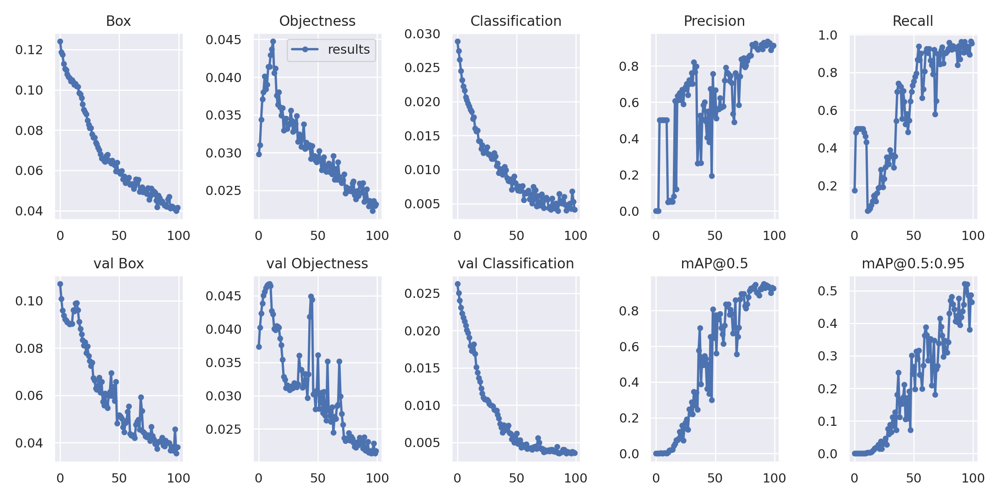

In [23]:
# taking outputs of the graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png) # for yolov5s

# YOLO v5l results

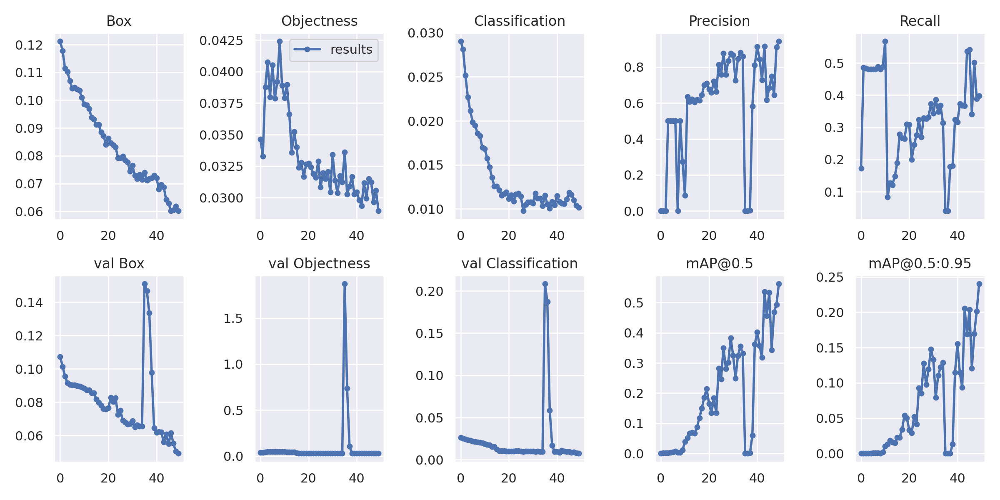

In [25]:
Image(filename='/content/yolov5/runs/train/yolov5l_results/results.png', width=1000)

# YOLO v5x results

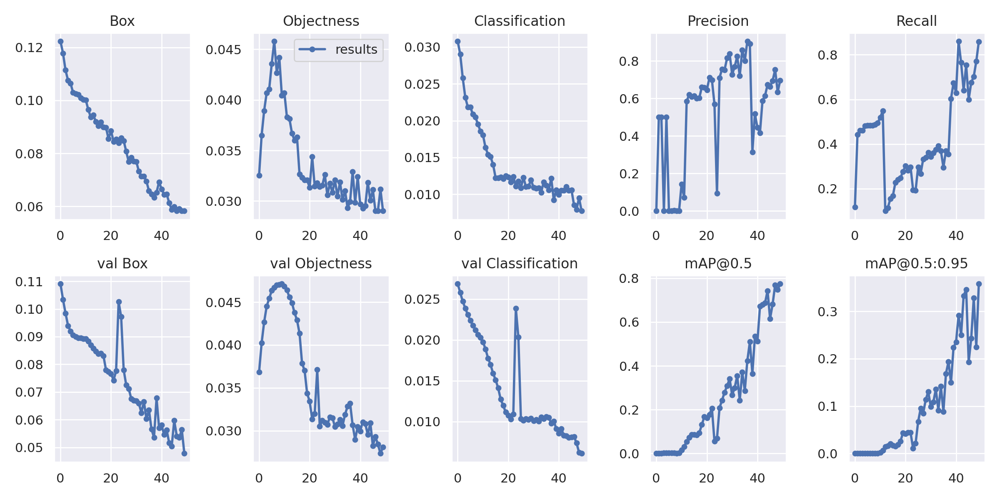

In [27]:
Image(filename='/content/yolov5/runs/train/yolov5x_results2/results.png', width=1000)

# Visualize the Training Data with Labels

we can view the `train*.jpg` images to see training images, labels and augmentation effects.

a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


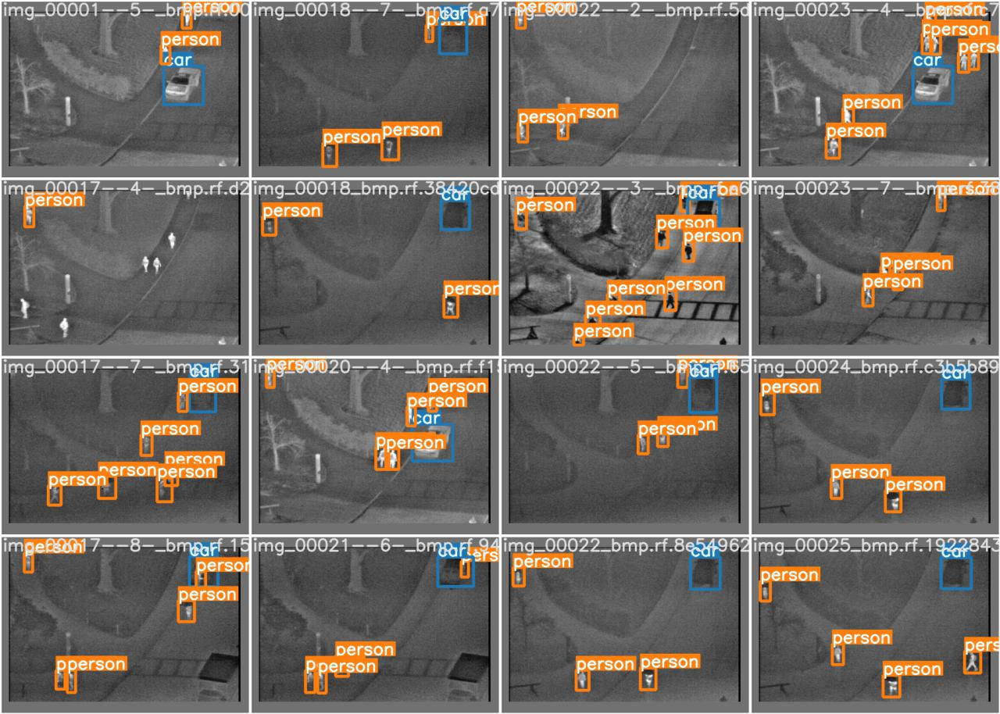

In [28]:
# display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

#Run Inference  With Trained Weights
Runing inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [29]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [30]:
%ls runs/train/yolov5s_results/weights #same for other models as well in the respective folders

best.pt  last.pt


# Testing using YOLOv5s trained weights

In [31]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPS
image 1/28 /content/yolov5/../test/images/img_00001_bmp.rf.eced4ee51b8e89579f8a0583a8a8a7cc.jpg: 288x416 1 car, 5 persons, Done. (0.028s)
image 2/28 /content/yolov5/../test/images/img_00005--2-

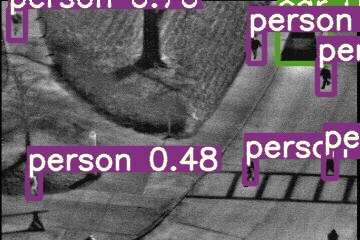

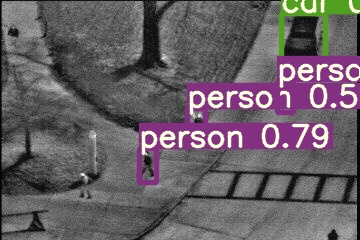

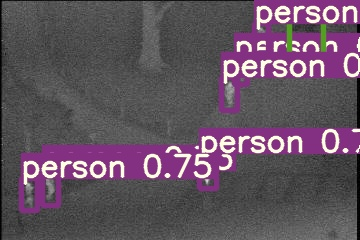

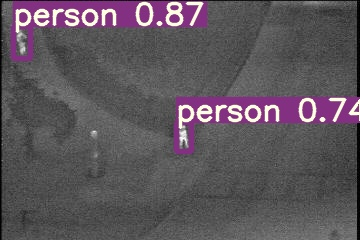

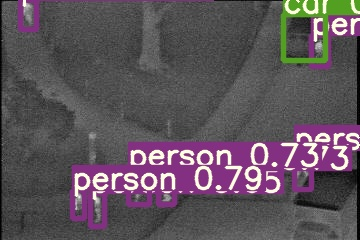

...

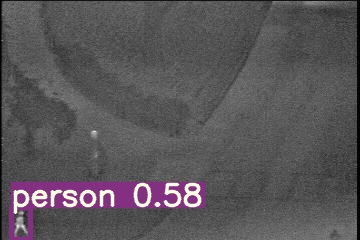

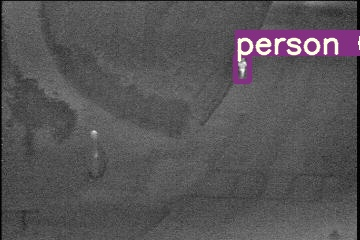

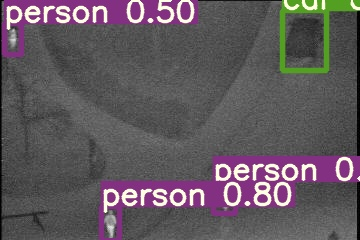

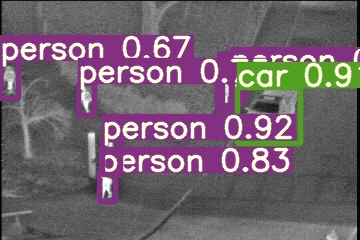

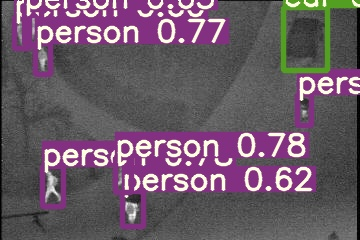

In [32]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Testing using YOLOv5l trained weights

In [39]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5l_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5l_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 392 layers, 46605951 parameters, 0 gradients, 114.1 GFLOPS
image 1/28 /content/yolov5/../test/images/img_00001_bmp.rf.eced4ee51b8e89579f8a0583a8a8a7cc.jpg: 288x416 5 persons, Done. (0.070s)
image 2/28 /content/yolov5/../test/images/img_00005--2-_bmp.

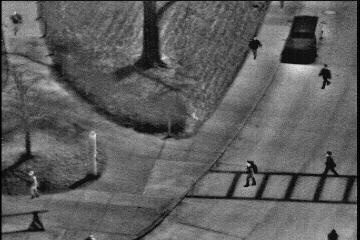

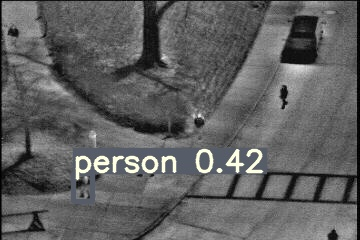

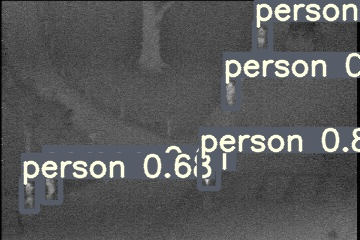

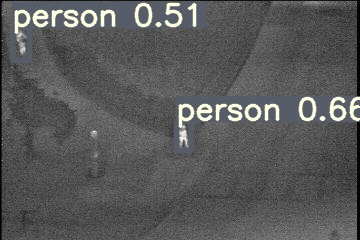

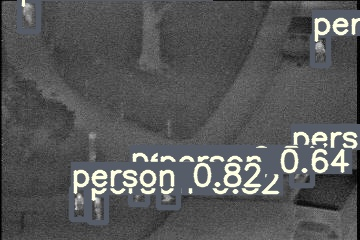

...

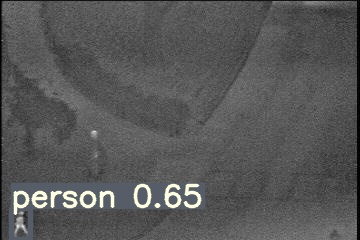

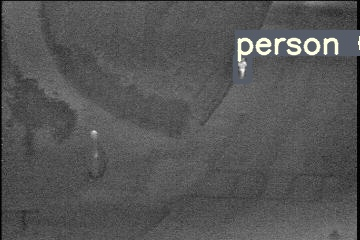

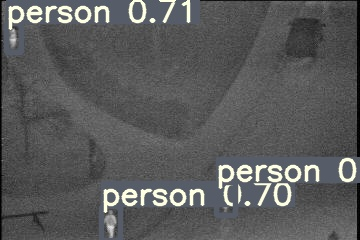

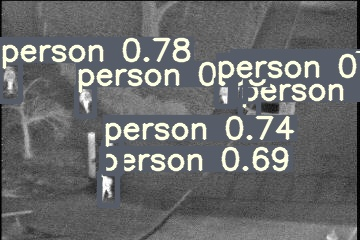

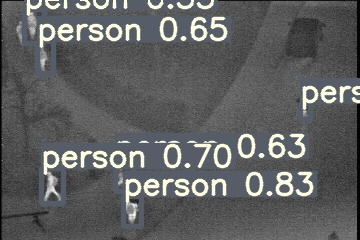

In [40]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Testing using YOLOv5x trained weights

In [41]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5x_results2/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5x_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 476 layers, 87205423 parameters, 0 gradients, 217.1 GFLOPS
image 1/28 /content/yolov5/../test/images/img_00001_bmp.rf.eced4ee51b8e89579f8a0583a8a8a7cc.jpg: 288x416 1 car, 5 persons, Done. (0.114s)
image 2/28 /content/yolov5/../test/images/img_00005-

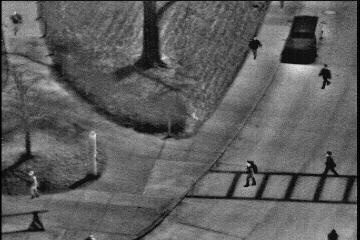

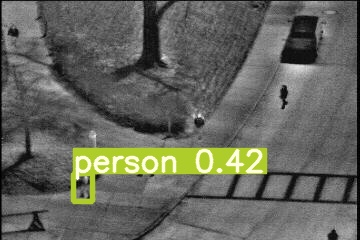

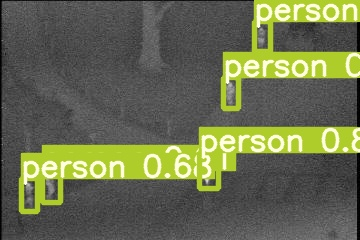

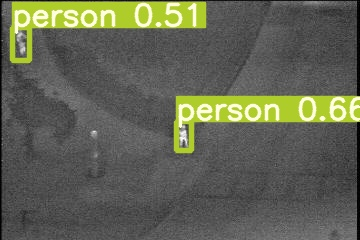

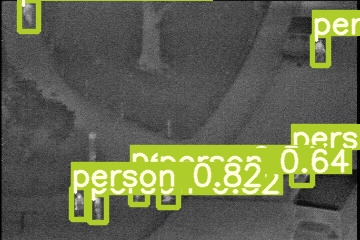

...

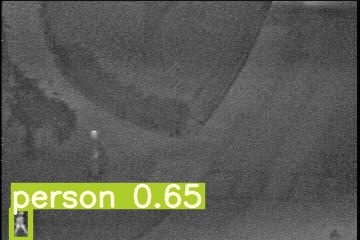

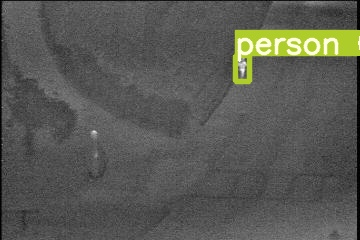

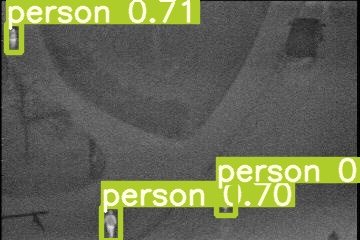

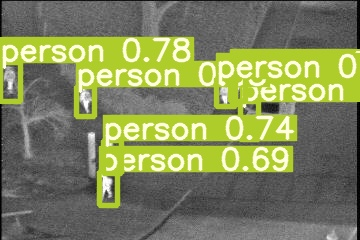

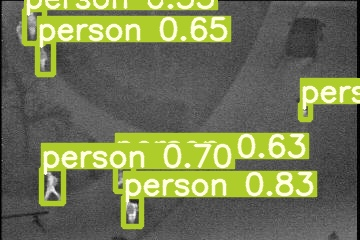

In [42]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# References:
1. [Yolov5 training on blood cell detection dataset tutorial](https://towardsdatascience.com/how-to-train-a-custom-object-detection-model-with-yolo-v5-917e9ce13208)
2. [Ultralytics yolov5 respository](https://github.com/ultralytics/yolov5)
3. [Roboflow annotate](https://app.roboflow.com/)
4. [Original colab notebook for code referencing](https://colab.research.google.com/drive/1gDZ2xcTOgR39tGGs-EZ6i3RTs16wmzZQ)
5. [Data used- OSU Thermal Pedestrian Database](http://vcipl-okstate.org/pbvs/bench/Data/01/download.html)